In [50]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,roc_auc_score, roc_curve, auc
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier,VotingClassifier,StackingClassifier,AdaBoostClassifier

from imblearn.under_sampling import RandomUnderSampler

In [32]:
import xgboost as xgb

!pip install xgboost



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
data=pd.read_csv(r"G:\datasets\creditcard.csv")
data.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [3]:
data.shape

(284807, 31)

In [4]:
data['Class'].value_counts()

Class
0    284315
1       492
Name: count, dtype: int64

In [5]:
data['Class'].value_counts(all)

Class
0    0.998273
1    0.001727
Name: proportion, dtype: float64

In [6]:
data.isna().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

<Axes: >

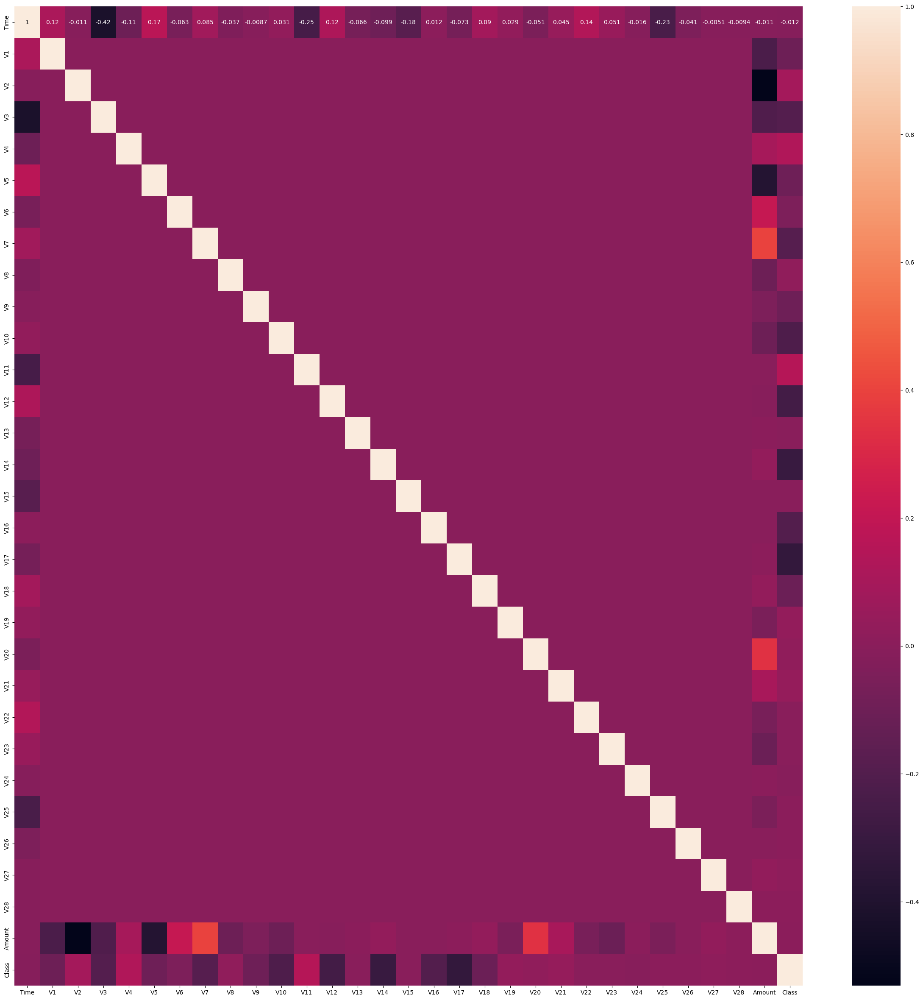

In [7]:
plt.figure(figsize=(30,30))
sns.heatmap(data.corr() , annot=True)

In [8]:
#split - not scaled data and unbalanced data
X=data.drop(columns='Class')
y=data['Class']
train_X,test_X,train_y,test_y=train_test_split(X,y,test_size=0.3,random_state=33)
print(train_X.shape , train_y.shape, test_X.shape, test_y.shape)
print(train_y.value_counts(all),test_y.value_counts(all))

(199364, 30) (199364,) (85443, 30) (85443,)
Class
0    0.99829
1    0.00171
Name: proportion, dtype: float64 Class
0    0.998233
1    0.001767
Name: proportion, dtype: float64


In [9]:
#not scaled and balanced data
under_sampling=RandomUnderSampler()
train_X_under_sampled,train_y_under_sampled = under_sampling.fit_resample(train_X,train_y)
not_scaled_balanced_data=pd.concat([train_X_under_sampled,train_y_under_sampled] , axis =1)
print(not_scaled_balanced_data['Class'].value_counts())
not_scaled_balanced_data.head()

Class
0    341
1    341
Name: count, dtype: int64


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
142630,84846.0,0.953609,-0.374478,1.148928,1.775856,-0.780040,0.621371,-0.453682,0.273237,1.258372,...,-0.377112,-0.761859,0.028245,0.082264,0.398587,-0.516357,0.078343,0.039914,75.90,0
276235,166973.0,1.691281,-0.831067,-0.123906,2.096741,-0.645750,0.641857,-0.683501,0.186018,0.484401,...,-0.289511,-0.993198,0.281204,-0.718715,-0.940533,1.974530,-0.167917,-0.043151,154.17,0
64530,51185.0,-0.435796,0.958823,1.393339,0.899186,0.294300,-0.008914,1.219294,-0.216163,-0.939767,...,-0.226917,-0.535118,0.075920,0.161893,-0.587023,-0.708890,-0.099920,-0.105507,71.57,0
255723,157366.0,-1.558936,1.803872,-2.728181,-1.714681,2.453092,3.064057,-0.187982,1.551850,0.487657,...,-0.422148,-0.987216,0.258442,0.577383,-0.197610,0.148615,0.135245,-0.037753,8.93,0
196403,131489.0,2.140677,-0.821772,-1.130052,-0.934560,-0.731548,-1.059847,-0.483109,-0.147072,-0.555316,...,-0.007224,-0.156144,0.312779,-0.036251,-0.315244,-0.442459,-0.044327,-0.068018,19.25,0


In [ ]:
#===================================================================================================================

<Axes: >

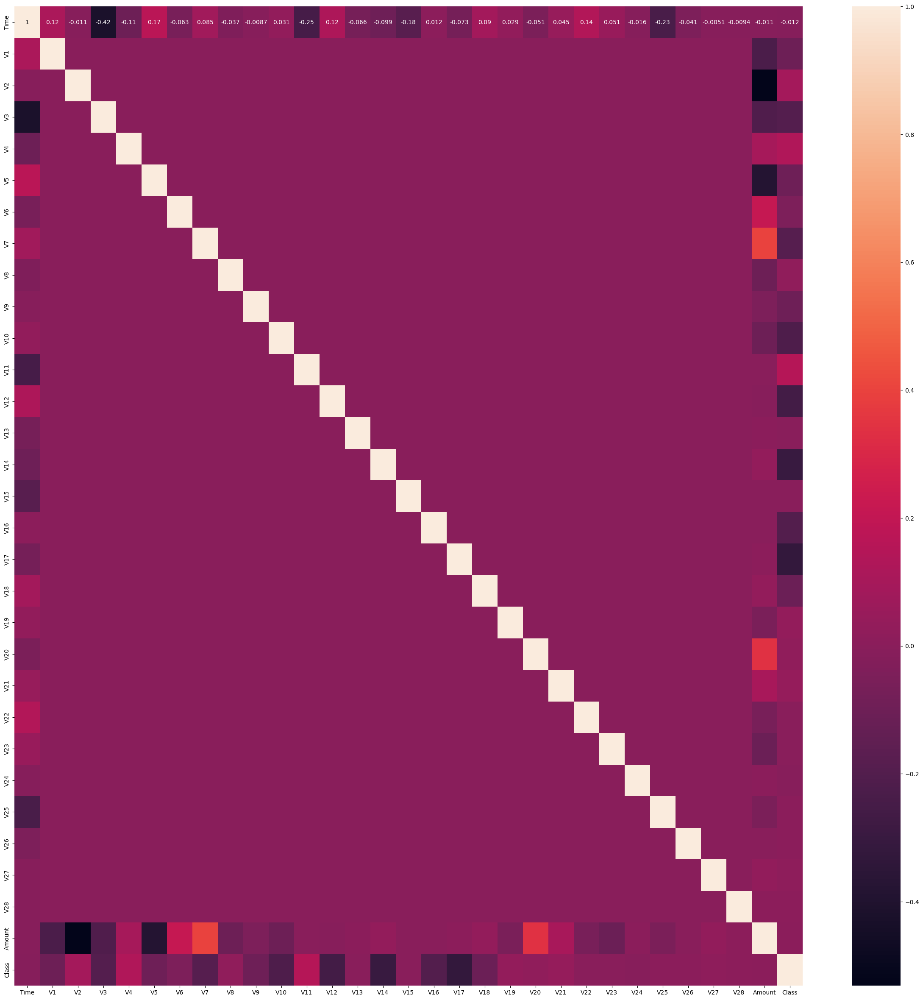

In [10]:
#split - scaled data
scale=StandardScaler()
X_scaled=pd.DataFrame(scale.fit_transform(X),columns=X.columns)
y=data['Class']
data_scaled=pd.concat([X_scaled,y],axis=1)
plt.figure(figsize=(30,30))
sns.heatmap(data_scaled.corr(), annot=True)

In [11]:
train_X_scaled,test_X_scaled,train_y,test_y=train_test_split(X_scaled,y,test_size=0.3,random_state=33)
print(train_X_scaled.shape,train_y.shape,test_X_scaled.shape,test_y.shape)
print(train_y.value_counts(all),test_y.value_counts(all))

(199364, 30) (199364,) (85443, 30) (85443,)
Class
0    0.99829
1    0.00171
Name: proportion, dtype: float64 Class
0    0.998233
1    0.001767
Name: proportion, dtype: float64


In [12]:
#scaled and balanced data
train_X_scaled_under_sampled,train_y_under_sampled=under_sampling.fit_resample(train_X_scaled,train_y)
scaled_balanced_data=pd.concat([train_X_scaled_under_sampled,train_y_under_sampled] , axis =1)
print(scaled_balanced_data['Class'].value_counts())
scaled_balanced_data.head()

Class
0    341
1    341
Name: count, dtype: int64


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
240675,1.176909,1.131754,-0.886669,-0.685033,-1.264893,-0.616507,0.108888,-0.927036,0.006748,-1.313826,...,-0.835130,-1.963831,0.732934,0.014222,-1.062431,-1.416560,0.018241,-0.124329,-0.143330,0
227179,1.056079,-0.371720,0.857999,-0.126458,-0.875039,1.287500,-0.666878,1.535556,-0.215373,-1.400066,...,0.177544,0.372074,-1.017309,1.130673,2.283421,1.391014,-0.260661,0.110565,-0.277666,0
141508,-0.220052,0.083581,0.299563,-0.136196,0.243501,0.153091,0.353935,-0.272900,0.340331,-1.542571,...,-0.157909,0.245960,0.109715,-2.172990,-1.652942,-0.526068,0.271092,0.080763,-0.317447,0
74324,-0.827489,-0.487679,0.666429,-0.297160,0.174025,1.703180,3.282013,-0.824412,-1.434588,-0.654025,...,-1.806810,0.391628,0.186644,1.644519,0.056189,-0.578251,0.050161,0.544570,-0.279904,0
253962,1.299277,0.282074,0.449408,0.115554,0.731757,0.130214,-0.278166,0.398769,-0.086277,-0.601582,...,-0.042900,0.160804,0.465453,0.079353,-3.625104,0.826822,0.736982,0.857413,-0.345313,0


In [13]:
results_df = pd.DataFrame(columns=["Model", "Strategy", "Recall of Fraud", "F1 Score", "ROC Score","Accuracy","test_confusion"])
def model_result(train_X,test_X,train_y,test_y,model,model_name,strategy):
    print(f"train_X shape: {train_X.shape}")
    print(f"train_y shape: {train_y.shape}")
    print(f"test_X shape: {test_X.shape}")
    print(f"test_y shape: {test_y.shape}")

    model.fit(train_X,train_y)
    train_pred = model.predict(train_X)
    test_pred = model.predict(test_X)
    
     # Display best parameters and best score if model is a GridSearchCV object
    if hasattr(model, 'best_params_'):
        print(f"Best Parameters for {model_name}: {model.best_params_}")
        print(f"Best Cross-Validation Score: {model.best_score_}")

#     print("Train Accuracy : ",accuracy_score(train_y, train_pred))
#     print("Test Accuracy : ",accuracy_score(test_y, test_pred))
#     print("Train Report : \n",classification_report(train_y, train_pred))
#     print("Test Report : \n",classification_report(test_y, test_pred))
#     print("Train Confusion. Matrix : \n",confusion_matrix(train_y, train_pred))
#     print("Test Confusion. Matrix  : \n",confusion_matrix(test_y, test_pred))  
#     print("TRAIN ROC AUC SCORE  : \n",roc_auc_score(train_y, train_pred))
#     print("Test ROC AUC SCORE  : \n",roc_auc_score(test_y, test_pred))
    
    test_report=classification_report(test_y, test_pred,output_dict=True)
    recall_of_fraud=test_report["1"]["recall"]
    f1_score=test_report["1"]["f1-score"]
    roc=roc_auc_score(test_y, test_pred)
    acc=accuracy_score(test_y, test_pred)
    test_con=confusion_matrix(test_y,test_pred)
    global results_df
    new_row= pd.DataFrame({
        "Model":[model_name],
        "Strategy":[strategy],
        "Recall of Fraud":[recall_of_fraud],
        "F1 Score":[f1_score],
        "ROC Score":[roc],
        "Accuracy":[acc],          
        "test_confusion":[test_con]
    })
    results_df=pd.concat([results_df,new_row],ignore_index=True)
    results_df.to_("model_result.csv", index=False)
    
    y_pred_proba = model.predict_proba(test_X)[:, 1] 
    # Calculate ROC curve
    fpr, tpr, thresholds = roc_curve(test_y, y_pred_proba) 
    roc_auc = auc(fpr, tpr)
    # Plot the ROC curve
    plt.figure()  
    plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], 'k--', label='No Skill')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for Fraudulent Transaction Classification')
    plt.legend()
    plt.show()
    
    # Plot TPR, FPR against thresholds to find the optimal one
    plt.figure(figsize=(10, 6))
    plt.plot(thresholds, tpr, label="True Positive Rate (Sensitivity)")
    plt.plot(thresholds, fpr, label="False Positive Rate (1 - Specificity)")
    plt.xlabel("Threshold")
    plt.ylabel("Rate")
    plt.title("TPR and FPR at Different Thresholds")
    plt.legend(loc="best")
    plt.show()
    
    # Optional: Calculate the optimal threshold based on Youden's J statistic
    j_scores = tpr - fpr
    optimal_idx = j_scores.argmax()
    optimal_threshold = thresholds[optimal_idx]
    print(f"Optimal Threshold (Youden's J): {optimal_threshold}")

    
    #print(results_df)
    return results_df


train_X shape: (199364, 30)
train_y shape: (199364,)
test_X shape: (85443, 30)
test_y shape: (85443,)


C:\Users\Gayathri\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Gayathri\AppData\Local\Temp\ipykernel_27632\444432378.py:42: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df=pd.concat([results_df,new_row],ignore_index=True)


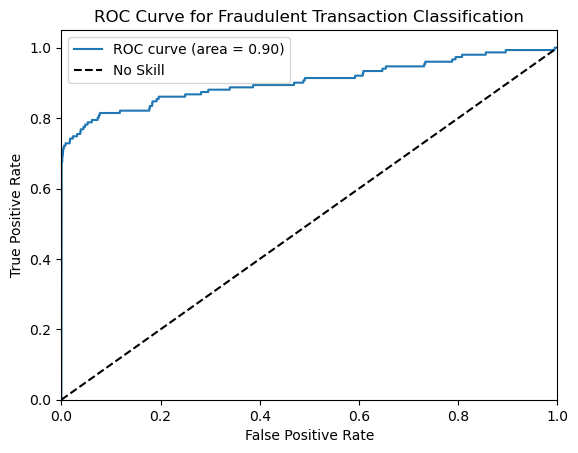

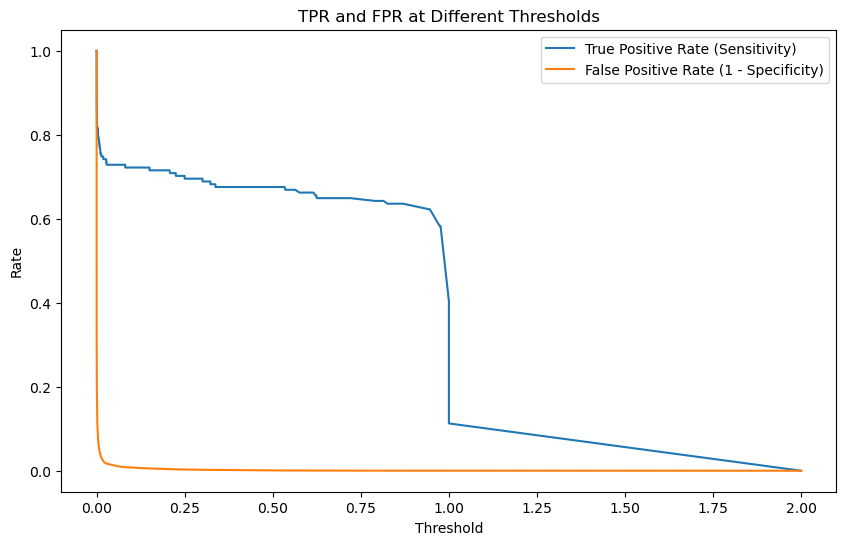

Optimal Threshold (Youden's J): 0.0038898170795416557


In [14]:
#logistic regression
model=LogisticRegression()
#1.notscaled unbalanced data
result=model_result(train_X,test_X,train_y,test_y,model,"logistic regression","notscaled unbalanced data")


train_X shape: (682, 30)
train_y shape: (682,)
test_X shape: (85443, 30)
test_y shape: (85443,)


C:\Users\Gayathri\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


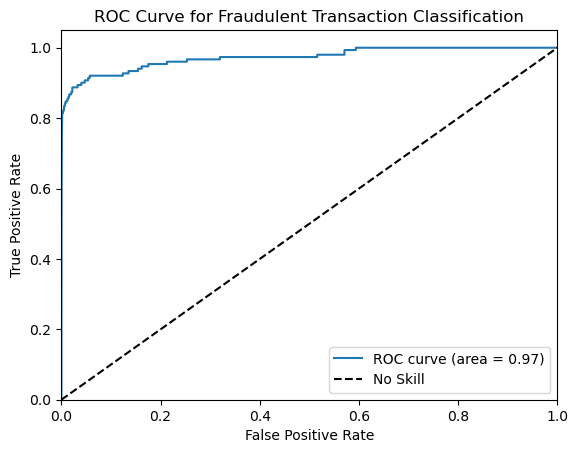

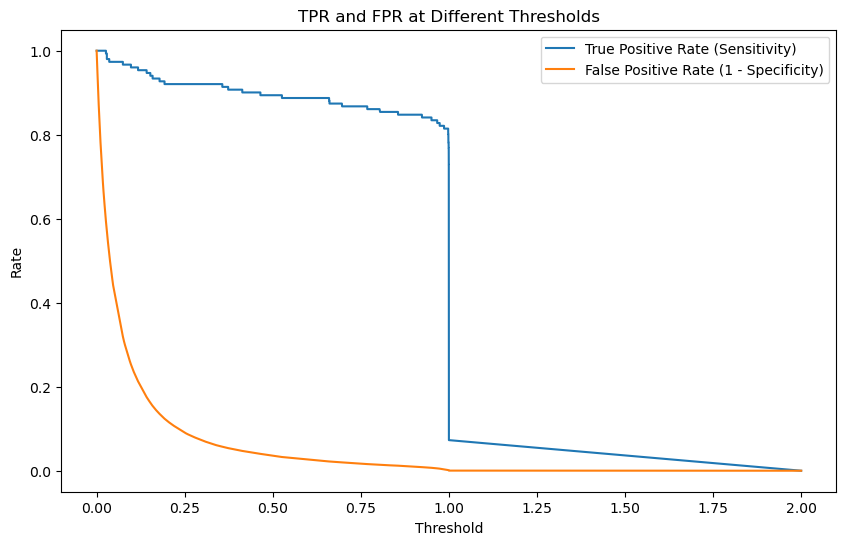

Optimal Threshold (Youden's J): 0.659823896777449


In [15]:
#2.notscaled balanced data
result=model_result(train_X_under_sampled,test_X,train_y_under_sampled,test_y,model,"logistic regression","notscaled balanced data")

train_X shape: (199364, 30)
train_y shape: (199364,)
test_X shape: (85443, 30)
test_y shape: (85443,)


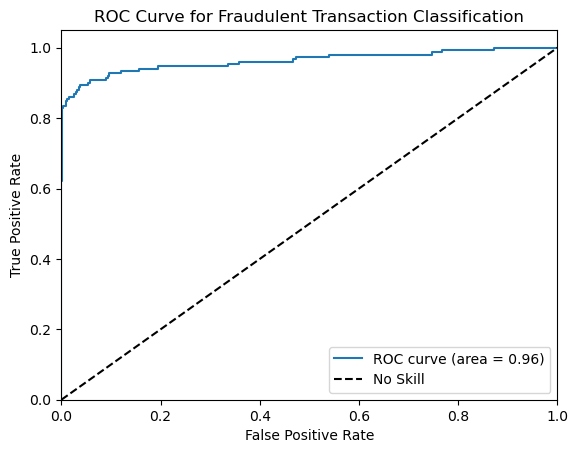

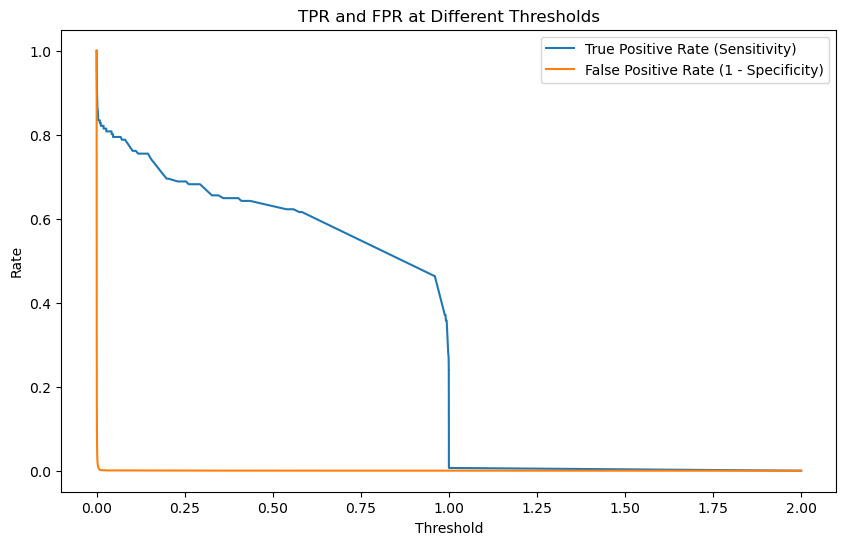

Optimal Threshold (Youden's J): 0.0016455353055169605


In [16]:
#3.scaled unbalanced data
result=model_result(train_X_scaled,test_X_scaled,train_y,test_y,model,"logistic regression","scaled unbalanced data")

train_X shape: (682, 30)
train_y shape: (682,)
test_X shape: (85443, 30)
test_y shape: (85443,)


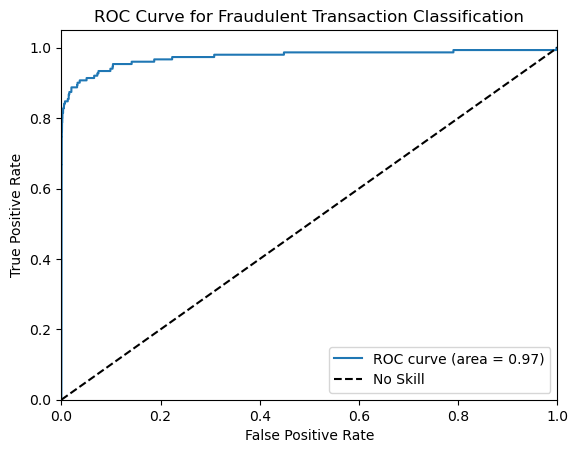

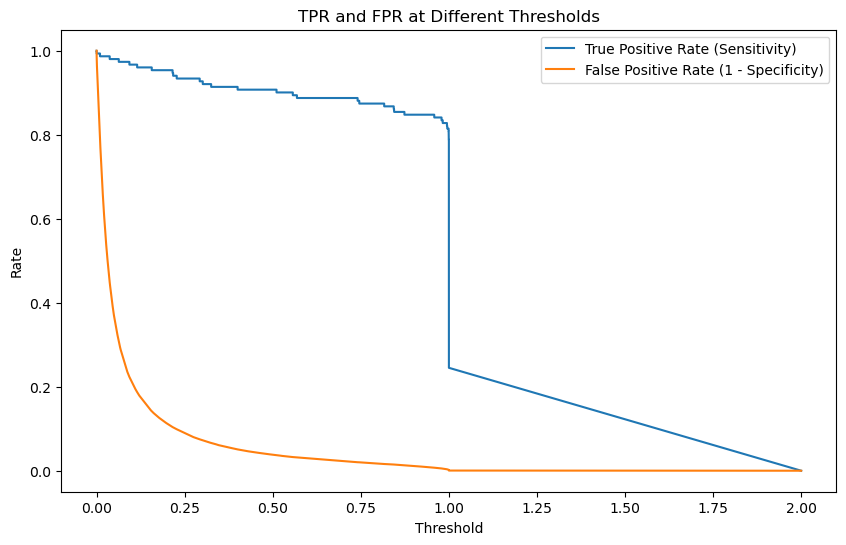

Optimal Threshold (Youden's J): 0.5106621496942966


In [17]:
#4.scaled balanced data
result=model_result(train_X_scaled_under_sampled,test_X_scaled,train_y_under_sampled,test_y,model,"logistic regression","scaled balanced data")

train_X shape: (682, 30)
train_y shape: (682,)
test_X shape: (85443, 30)
test_y shape: (85443,)


C:\Users\Gayathri\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


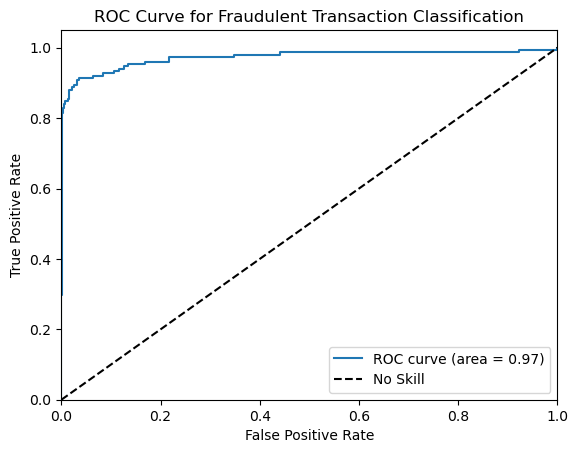

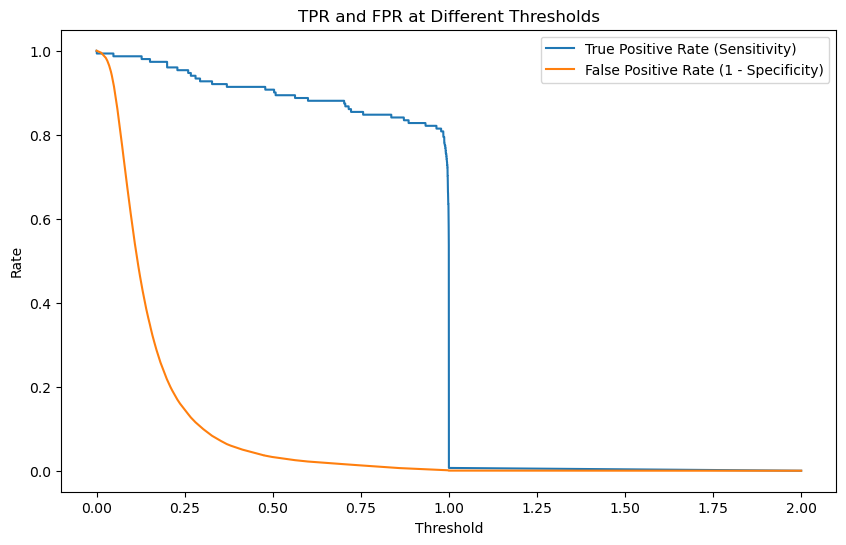

Optimal Threshold (Youden's J): 0.47860395669463324


In [18]:
#Elastic
#5.scaled balanced data - elastic
model=LogisticRegression(penalty='elasticnet',solver='saga', l1_ratio=0.5)
result=model_result(train_X_scaled_under_sampled,test_X_scaled,train_y_under_sampled,test_y,model,"Elastic","scaled balanced data")

train_X shape: (682, 30)
train_y shape: (682,)
test_X shape: (85443, 30)
test_y shape: (85443,)


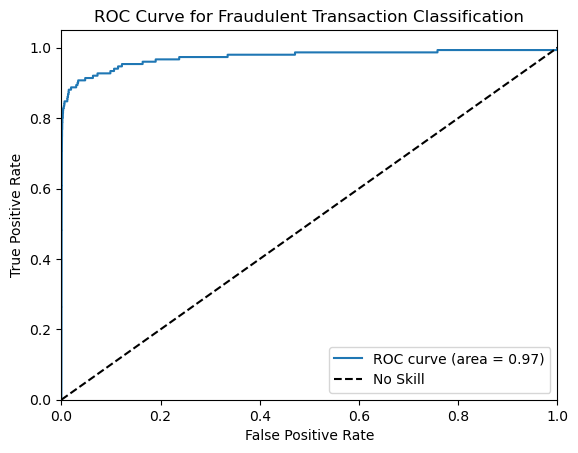

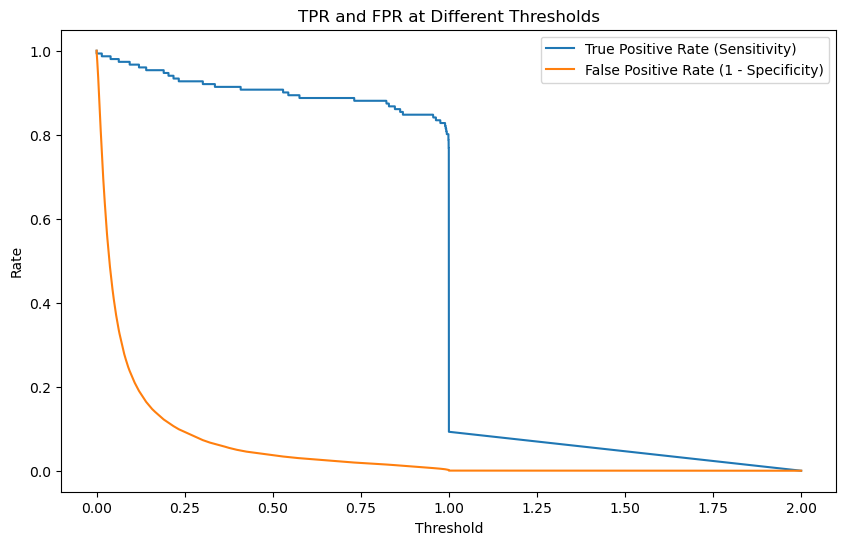

Optimal Threshold (Youden's J): 0.5292800695835616


In [19]:
#Lasso
#6.scaled balanced data - lasso
model=LogisticRegression(penalty='l1',solver='liblinear')
result=model_result(train_X_scaled_under_sampled,test_X_scaled,train_y_under_sampled,test_y,model,"Lasso","scaled balanced data")

train_X shape: (682, 30)
train_y shape: (682,)
test_X shape: (85443, 30)
test_y shape: (85443,)


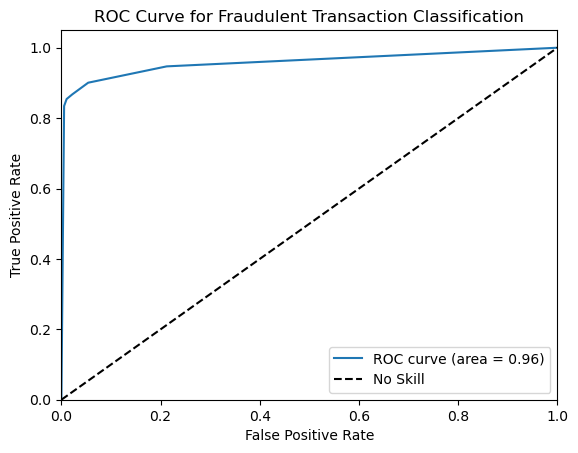

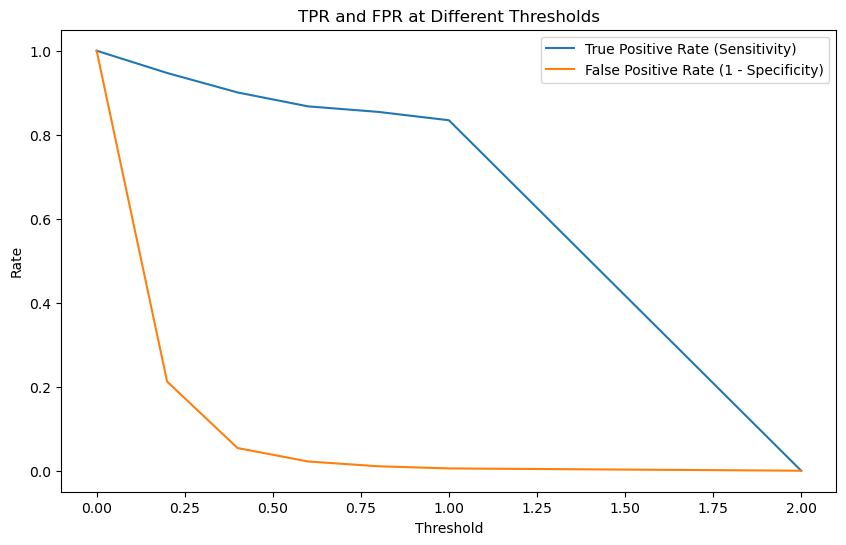

Optimal Threshold (Youden's J): 0.4


In [20]:
#KNN
#7.scaled balanced data -knn
model=KNeighborsClassifier()
result=model_result(train_X_scaled_under_sampled,test_X_scaled,train_y_under_sampled,test_y,model,"KNN","scaled balanced data")

train_X shape: (682, 30)
train_y shape: (682,)
test_X shape: (85443, 30)
test_y shape: (85443,)


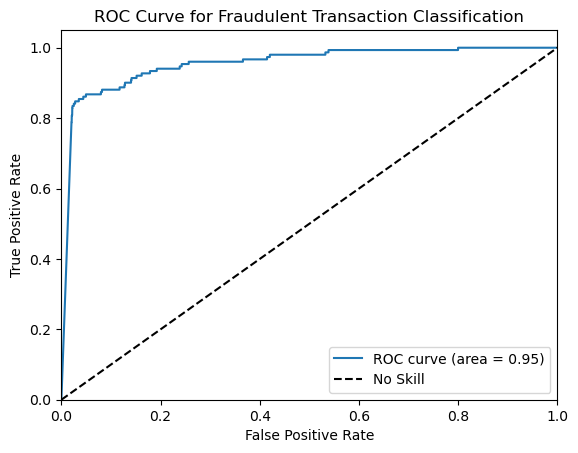

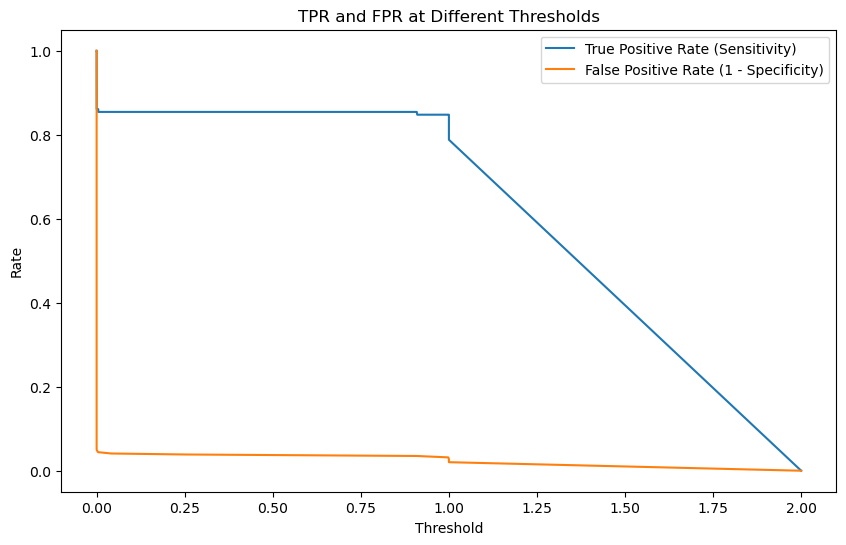

Optimal Threshold (Youden's J): 0.9999980601962248


In [21]:
#Naive bayes
#8.scaled balanced data -naivebayes
model=GaussianNB()
result=model_result(train_X_scaled_under_sampled,test_X_scaled,train_y_under_sampled,test_y,model,"GaussionNB","scaled balanced data")

train_X shape: (682, 30)
train_y shape: (682,)
test_X shape: (85443, 30)
test_y shape: (85443,)


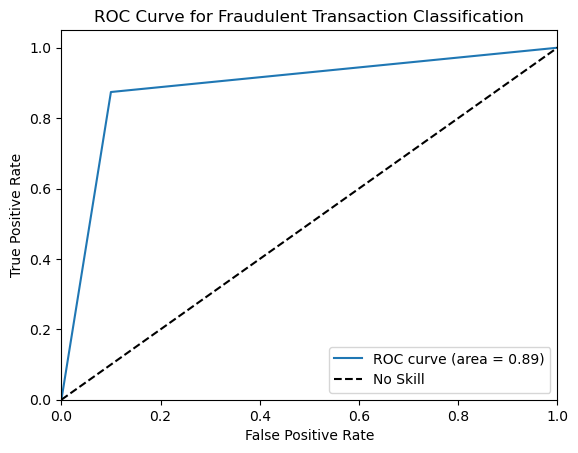

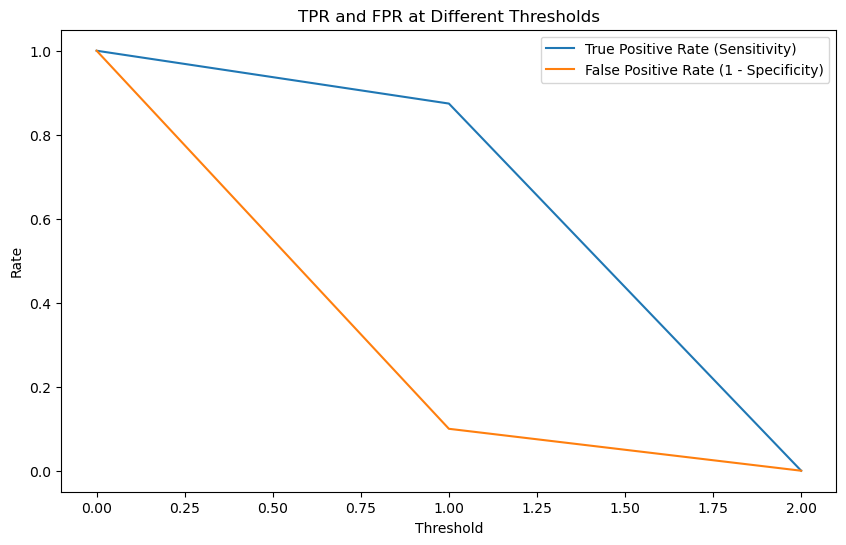

Optimal Threshold (Youden's J): 1.0


In [22]:
#Decisiontree
#9.scaled balanced data -decisiontree
model=DecisionTreeClassifier()
result=model_result(train_X_scaled_under_sampled,test_X_scaled,train_y_under_sampled,test_y,model,"Decisiontree","scaled balanced data")

train_X shape: (682, 30)
train_y shape: (682,)
test_X shape: (85443, 30)
test_y shape: (85443,)


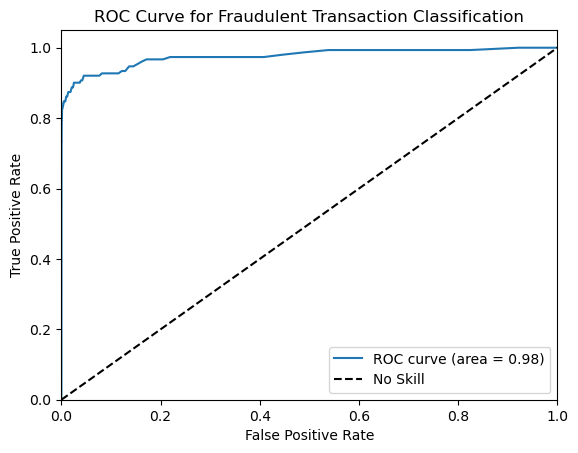

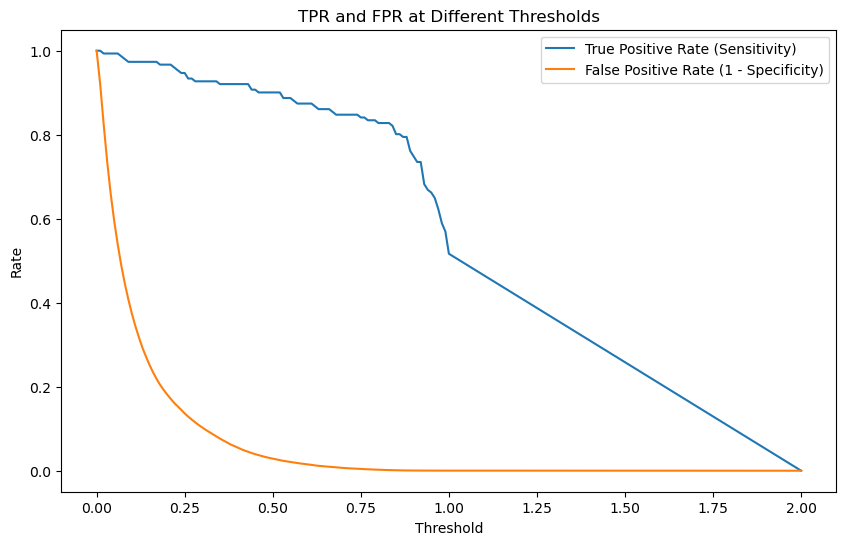

Optimal Threshold (Youden's J): 0.52


In [23]:
#randomforest
#10.scaled balanced data - randomforest
model=RandomForestClassifier()
result=model_result(train_X_scaled_under_sampled,test_X_scaled,train_y_under_sampled,test_y,model,"Randomforest classifier","scaled balanced data")

train_X shape: (682, 30)
train_y shape: (682,)
test_X shape: (85443, 30)
test_y shape: (85443,)
Fitting 5 folds for each of 7200 candidates, totalling 36000 fits
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0

[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total

[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total

[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; 

[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[

[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.

[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=

[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.

[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=

[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s

[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=

[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0

[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=

[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s


[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=

[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=

[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=

[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   

[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total tim

[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total

[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total

[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total t

[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; tot

[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5;

[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20;

[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[C

[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.

[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=

[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=

[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0

[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=  

[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0

[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[

[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=

[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0

[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total t

[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=

[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total tim

[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total ti

[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total tim

[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; to

[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; tot

[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=

[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total tim

[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total tim

[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0

[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=

[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=

[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0

[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0

[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0

[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=

[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=

[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time

[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0

[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0

[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=

[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=

[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criteri

[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] EN

[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END cr

[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0

[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END cr

[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] E

[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END

[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0

[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[C

[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=

[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=

[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=

[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criteri

[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] 

[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criteri

[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END 

[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0

[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END cri

[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] EN

[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] EN

[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] EN

[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s


[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0

[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV

[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0

[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0

[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=

[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criter

[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END

[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0

[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END crite

[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END 

[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s


[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END 

[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s

[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0

[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0

[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0

[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=

[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0

[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0

[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END 

[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END 

[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criteri

[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] E

[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] E

[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END

[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0

[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[

[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s


[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0

[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0

[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0

[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=  

[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0

[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0

[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END

[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END 

[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[

[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=  

[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0

[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0

[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=  

[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0

[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END cr

[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] E

[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END 

[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END crit

[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s

[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END cri

[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END 

[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s


[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0

[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s

[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0

[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=

[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0

[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=

[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criteri

[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0

[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s


[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criteri

[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] 

[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s

[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criteri

[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] 

[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END

[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0

[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV

[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0

[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total

[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=

[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criteri

[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END 

[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END cri

[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] E

[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] EN

[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END crit

[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] 

[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END

[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0

[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=

[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0

[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s

[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time= 

[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0

[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=

[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END crite

[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END 

[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criteri

[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] EN

[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] EN

[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END

[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=

[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0

[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV

[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   

[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=

[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[

[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] E

[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END

[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s

[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criteri

[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END 

[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0

[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END 

[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END

[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV

[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   

[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV

[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s


[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.

[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=

[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=

[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END cri

[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END 

[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[C

[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criter

[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] EN

[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criter

[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END 

[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] 

[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0

[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0

[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0

[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[

[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0

[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time= 

[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END c

[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] EN

[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] E

[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criteri

[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] 

[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criteri

[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] 

[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] E

[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] E

[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV]

[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=gini, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=

[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_

[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_sam

[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samp

[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, mi

[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; tota

[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split

[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_sp

[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_spli

[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; 

[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5;

[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_spl

[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=

[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_

[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; tota

[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_spl

[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_sp

[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5;

[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5;

[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_sampl

[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_

[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_sp

[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_s

[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min

[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, mi

[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min

[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; to

[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2

[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_sp

[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_spl

[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; 

[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=

[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split

[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5;

[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_sampl

[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total

[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_spl

[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_sp

[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=

[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=

[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples

[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samp

[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_sp

[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_sampl

[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_sam

[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_sa

[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; 

[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=

[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_sp

[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5;

[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; 

[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_spl

[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_

[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_sp

[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; tota

[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5;

[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_spli

[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_sampl

[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5;

[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_sample

[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_sp

[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=None, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samp

[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total

[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_spl

[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_

[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split

[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0

[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time

[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total

[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total

[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=

[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=

[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time

[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total

[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20;

[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0

[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total ti

[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; t

[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total t

[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total tim

[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; tot

[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; to

[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; to

[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=1

[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20;

[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10

[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10

[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_sampl

[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time= 

[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=

[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=

[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20;

[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=  

[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total t

[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total t

[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20;

[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=

[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total ti

[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=

[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total ti

[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; 

[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2;

[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total

[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20;

[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_spli

[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5;

[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=

[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total ti

[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total

[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total ti

[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=

[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=

[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time

[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total ti

[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total t

[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total

[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=

[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total 

[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; tot

[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=

[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; t

[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total

[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5;

[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_sample

[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_spl

[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=  

[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=

[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total

[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total 

[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=

[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=

[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total

[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total ti

[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20;

[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0

[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total tim

[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20;

[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total

[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total ti

[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; to

[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20;

[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; tota

[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; 

[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5;

[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_spl

[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5;

[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_sp

[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.

[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total

[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total 

[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   

[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total

[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total

[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total t

[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0

[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=

[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total

[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total

[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total t

[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; 

[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_spl

[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5;

[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; to

[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5;

[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=

[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=

[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=

[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total 

[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total

[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=  

[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time

[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total

[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total tim

[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=  

[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total t

[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20;

[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total

[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time

[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; tot

[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_spli

[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; tota

[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; to

[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_spl

[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5;

[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_spli

[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0

[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=

[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=

[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total

[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total

[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time= 

[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total t

[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total

[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=

[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0

[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total t

[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total tim

[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=

[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total ti

[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total

[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20;

[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20;

[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_spl

[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20;

[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_spli

[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5;

[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_spl

[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.

[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=

[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total

[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total

[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   

[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total ti

[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=

[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20;

[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=

[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total tim

[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=10; total tim

[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total t

[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; tota

[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5;

[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20;

[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; 

[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5;

[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_spl

[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0

[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total

[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total

[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total

[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0

[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total

[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total

[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0

[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total ti

[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total

[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=

[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total

[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; t

[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total

[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=30, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2;

[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; t

[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5;

[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5;

[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_sp

[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=

[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total 

[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total

[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=

[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.

[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total

[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5; total time=

[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total t

[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0

[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; total time

[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time

[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total

[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; t

[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total ti

[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total

[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_spl

[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=None, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2;

[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; 

[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_spl

[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_sampl

[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_sp

[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10; total time=   

[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time

[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total

[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total 

[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5; total time=   0.0

[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5; total time=

[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total

[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total t

[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=20; total time=

[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2; total tim

[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=

[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20;

[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=2; total

[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2; to

[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=sqrt, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=2, min_samples_split=5; total

[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=20;

[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_spl

[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_sp

[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=None, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_sp

[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0

[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total 

[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=10, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=20; total

[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10; total time=   

[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2; total 

[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.01, min_samples_leaf=10, min_samples_split=5; total

[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=20, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=20; total

[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5; total time=   0.0

[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10; total time

[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=1, min_samples_split=10; total 

[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=50, min_impurity_decrease=0.05, min_samples_leaf=10, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total tim

[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=10; tota

[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=20;

[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=40, max_features=log2, max_leaf_nodes=100, min_impurity_decrease=0.05, min_samples_leaf=4, min_samples_split=5; total

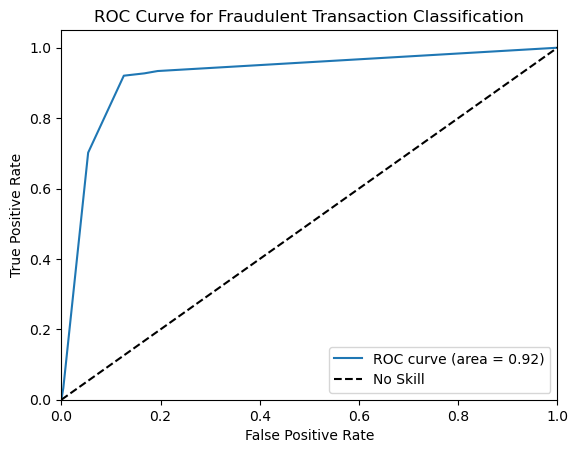

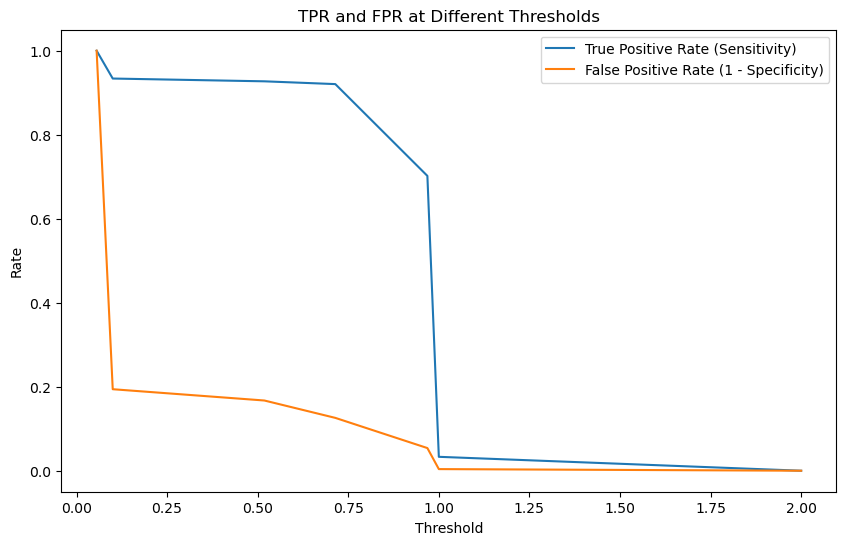

Optimal Threshold (Youden's J): 0.7142857142857143


In [24]:
#Tuned Decision Tree
#11.scaled balanced data - tuned decisiontree (Gridsearch)

param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20, 30, 40],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 2, 4, 10],
    'max_features': [None, 'sqrt', 'log2'],
    'max_leaf_nodes': [None, 10, 20, 50, 100],
    'min_impurity_decrease': [0.0, 0.01, 0.05]
}
model=DecisionTreeClassifier()

grid_search=GridSearchCV(estimator=model,param_grid=param_grid,cv=5,verbose=2,scoring='accuracy')

result=model_result(train_X_scaled_under_sampled,test_X_scaled,train_y_under_sampled,test_y,grid_search,"Decisiontree classifier - Tuned(gridsearch)","scaled balanced data")

#Best Parameters for Decisiontree classifier - Tuned(gridsearch): {'criterion': 'gini', 'max_depth': 10, 'max_features': 'sqrt', 'max_leaf_nodes': 10, 'min_impurity_decrease': 0.01, 'min_samples_leaf': 1, 'min_samples_split': 2}

train_X shape: (682, 30)
train_y shape: (682,)
test_X shape: (85443, 30)
test_y shape: (85443,)
Fitting 5 folds for each of 1728 candidates, totalling 8640 fits
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.

[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   1.6s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.5s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.5s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.5s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.4s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, 

[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   2.6s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.7s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, 

[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sq

[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=s

[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=s

[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2,

[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, 

[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, 

[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=lo

[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=l

[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=l

[CV] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impur

[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity

[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity

[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impu

[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_imp

[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_imp

[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurit

[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity

[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity

[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impu

[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_imp

[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_imp

[CV] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurit

[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity

[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.8s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity

[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impu

[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.9s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_imp

[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_imp

[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurit

[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.9s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity

[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity

[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impu

[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_imp

[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_imp

[CV] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurit

[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity

[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity

[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impu

[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_imp

[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_imp

[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurit

[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.8s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity

[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity

[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impu

[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_imp

[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_imp

[CV] END bootstrap=True, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, 

[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=

[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth

[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_dep

[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, ma

[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, ma

[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, ma

[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, max_dep

[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, max_dep

[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_dep

[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, ma

[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, ma

[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, ma

[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max

[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max

[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max

[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10

[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10,

[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.8s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, 

[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_fe

[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_fea

[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_feat

[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max

[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max

[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=10, max

[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.8s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_feat

[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_feat

[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_feat

[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max

[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max

[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max

[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_feat

[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.8s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_feat

[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_feat

[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max

[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max

[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   1.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=20, max

[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.8s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.9s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.9s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_feat

[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.9s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.8s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.8s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_feat

[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_feat

[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max

[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max

[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max

[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_feat

[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_feat

[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_feat

[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max

[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, ma

[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, m

[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=True, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_f

[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_feature

[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_feature

[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_featu

[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_f

[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_

[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_

[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_featu

[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_featu

[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_featu

[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_

[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_

[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=None, max_

[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, mi

[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, mi

[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, mi

[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqr

[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqr

[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqr

[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, mi

[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, mi

[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, mi

[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log

[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log

[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=10, max_features=log

[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, mi

[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, mi

[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.8s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, mi

[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqr

[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqr

[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqr

[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, mi

[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, mi

[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, mi

[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log

[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log

[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=20, max_features=log

[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, mi

[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.8s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, mi

[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, mi

[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqr

[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqr

[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=sqr

[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, mi

[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, mi

[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, mi

[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log

[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log

[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.3s
[CV] END bootstrap=False, class_weight=None, max_depth=30, max_features=log

[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.9s
[CV] END bootstrap=False, class_weight=balanced, m

[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, m

[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.7s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, m

[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanc

[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanc

[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanc

[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, m

[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.8s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, ma

[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max

[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced,

[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, 

[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, m

[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.9s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.9s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.9s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   1.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, ma

[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.9s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.9s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.8s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, ma

[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.8s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.8s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, ma

[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=1

[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=balanced, max_depth=1

[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=balanced, max_depth=1

[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.7s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, ma

[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, ma

[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, ma

[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=1

[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=1

[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=balanced, max_depth=1

[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, ma

[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.9s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, ma

[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   0.8s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   0.8s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, ma

[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=2

[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=2

[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=2

[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.9s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   1.0s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   1.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.9s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, ma

[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.8s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.8s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.7s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, ma

[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   0.7s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   0.7s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, ma

[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=2

[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=2

[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=2

[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, ma

[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, ma

[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, ma

[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=balanced, max_depth=3

[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=3

[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, class_weight=balanced, max_depth=

[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=sqrt, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30

[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.8s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.8s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30,

[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.8s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.8s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30

[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=False, class_weight=balanced, max_depth=3

[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=False, class_weight=balanced, max_de

[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=False, class_weight=balanced, max_de

[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_depth=30, max_features=log2, min_impurity_decrease=0.01, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END bootstrap=False, class_weight=balanced, max_de

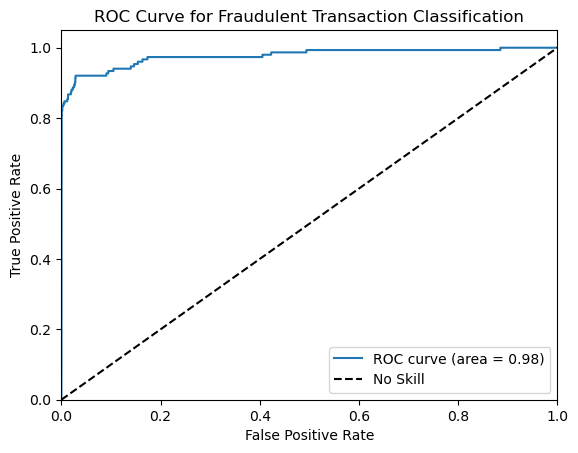

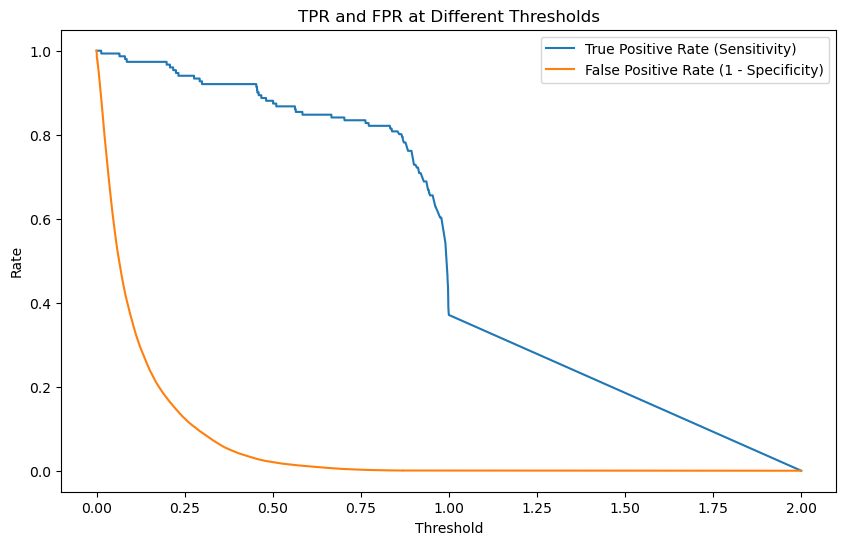

Optimal Threshold (Youden's J): 0.4532121212121212


In [27]:
#Tuned randomforest
#12.scaled balanced data - tuned randomforest (Gridsearch)

param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2'],
    'bootstrap': [True, False],
    'class_weight': [None, 'balanced'],
    'min_impurity_decrease': [0.0, 0.01]
}
model=RandomForestClassifier()

grid_search=GridSearchCV(estimator=model,param_grid=param_grid,cv=5,verbose=2,scoring='accuracy')

result=model_result(train_X_scaled_under_sampled,test_X_scaled,train_y_under_sampled,test_y,grid_search,"Randomforest classifier - Tuned(gridsearch)","scaled balanced data")

# Best Parameters for Randomforest classifier - Tuned(gridsearch): {'bootstrap': True, 'class_weight': None, 'max_depth': None, 'max_features': 'sqrt', 'min_impurity_decrease': 0.0, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}


In [ ]:
#Tuned Decision Tree
#13.scaled balanced data - tuned decisiontree (random Gridsearch)

# Parameter distribution for random search
param_dist = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20, 30, 40],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 2, 4, 10],
    'max_features': [None, 'sqrt', 'log2'],
    'max_leaf_nodes': [None, 10, 20, 50, 100],
    'min_impurity_decrease': [0.0, 0.01, 0.05]
}
model=DecisionTreeClassifier()
# Set up RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=model,param_distributions=param_dist,n_iter=50, cv=5,verbose=2,scoring='accuracy',random_state=42)

result=model_result(train_X_scaled_under_sampled,test_X_scaled,train_y_under_sampled,test_y,random_search,"Decisiontree classifier - Tuned(random gridsearch)","scaled balanced data")

#Best Parameters for Decisiontree classifier - Tuned(random gridsearch): {'min_samples_split': 10, 'min_samples_leaf': 2, 'min_impurity_decrease': 0.0, 'max_leaf_nodes': 10, 'max_features': 'sqrt', 'max_depth': 20, 'criterion': 'entropy'}

In [ ]:
#Tuned randomforest
#14.scaled balanced data - tuned randomforest ( random Gridsearch)

param_dist = {
    'n_estimators': [int(x) for x in range(100, 1000, 100)],
    'max_depth': [None] + list(range(10, 50, 10)),
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2'],
    'bootstrap': [True, False],
    'class_weight': [None, 'balanced'],
    'min_impurity_decrease': stats.uniform(0.0, 0.02)
}

model=RandomForestClassifier()

random_search = RandomizedSearchCV(estimator=model,param_distributions=param_dist,n_iter=100,  cv=5,verbose=2,random_state=42,scoring='accuracy')

result=model_result(train_X_scaled_under_sampled,test_X_scaled,train_y_under_sampled,test_y,random_search,"Randomforest classifier - Tuned(random gridsearch)","scaled balanced data")


# Best Parameters for Randomforest classifier - Tuned(random gridsearch): {'bootstrap': True, 'class_weight': None, 'max_depth': None, 'max_features': 'log2', 'min_impurity_decrease': 0.0036447217557612466, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 600}

In [ ]:
#adaboost
#15.scaled balanced data - adaboost  
model=AdaBoostClassifier(n_estimators=200)
result=model_result(train_X_scaled_under_sampled,test_X_scaled,train_y_under_sampled,test_y,model,"Ada boost","scaled balanced data")

In [ ]:
#Gradientboostclassifier
#16.scaled balanced data - gradientboost  
model=GradientBoostingClassifier(n_estimators=500)
result=model_result(train_X_scaled_under_sampled,test_X_scaled,train_y_under_sampled,test_y,model,"gradient boost","scaled balanced data")

In [ ]:
#xbg boost
#17.scaled balanced data - xbg
model = xgb.XGBClassifier(eval_metric='auc')
result=model_result(train_X_scaled_under_sampled,test_X_scaled,train_y_under_sampled,test_y,model,"xbg boost","scaled balanced data")

train_X shape: (682, 30)
train_y shape: (682,)
test_X shape: (85443, 30)
test_y shape: (85443,)


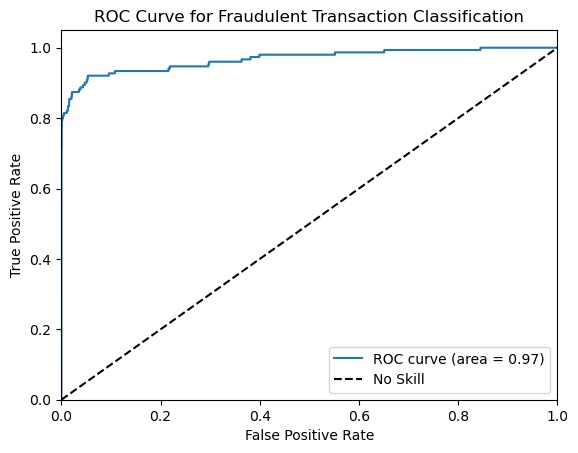

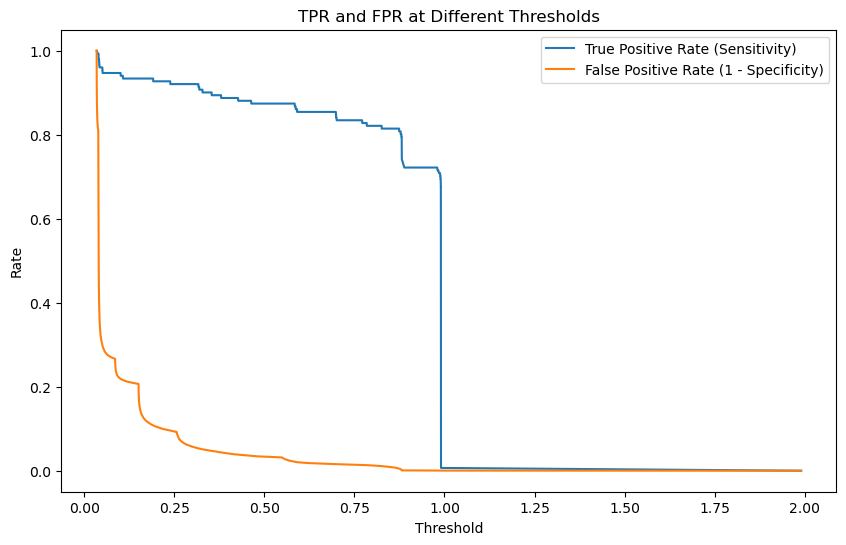

Optimal Threshold (Youden's J): 0.3167309233286717


In [72]:
#voting_model1
clf1 = DecisionTreeClassifier(criterion='gini', max_depth= 10, max_features= 'sqrt', max_leaf_nodes= 10, min_impurity_decrease= 0.01, min_samples_leaf= 1, min_samples_split= 2)
clf2 = DecisionTreeClassifier(min_samples_split= 10, min_samples_leaf= 2, min_impurity_decrease=0.0, max_leaf_nodes= 10, max_features= 'sqrt', max_depth= 20, criterion= 'entropy')
clf3 = xgb.XGBClassifier(eval_metric='auc')


voting_model1 = VotingClassifier(estimators=[('dt', clf1), ('dt1', clf2), ('xbg', clf3)], voting='soft')
result=model_result(train_X_scaled_under_sampled,test_X_scaled,train_y_under_sampled,test_y,voting_model1,"votingclassifier1(DT,DT,XBG)","scaled balanced data")


train_X shape: (682, 30)
train_y shape: (682,)
test_X shape: (85443, 30)
test_y shape: (85443,)


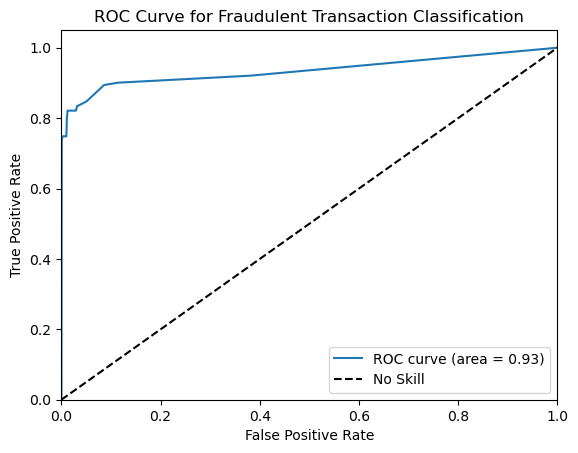

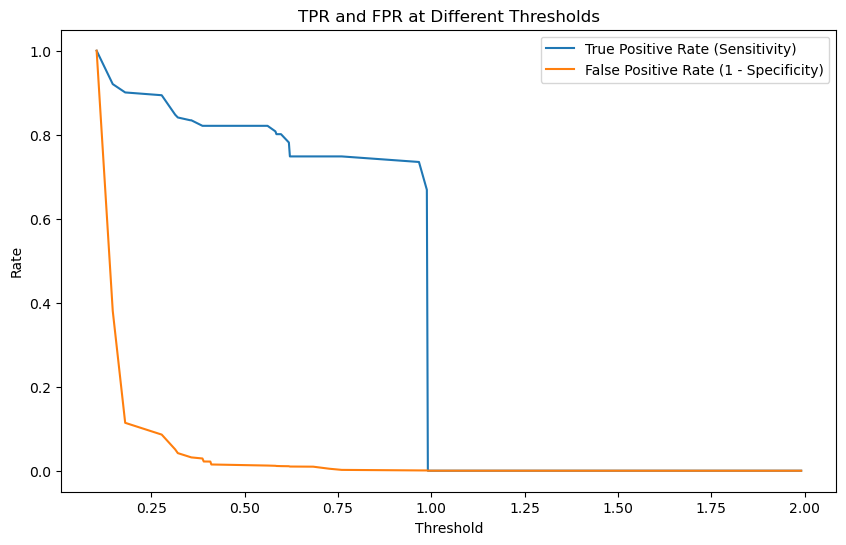

Optimal Threshold (Youden's J): 0.5612073112073113


In [63]:
# voting_model2
clf1 = DecisionTreeClassifier(criterion='gini', max_depth= 10, max_features= 'sqrt', max_leaf_nodes= 10, min_impurity_decrease= 0.01, min_samples_leaf= 1, min_samples_split= 2)
clf2 = DecisionTreeClassifier(criterion='gini', max_depth= 10, max_features= 'sqrt', max_leaf_nodes= 10, min_impurity_decrease= 0.01, min_samples_leaf= 1, min_samples_split= 2)
clf3 = DecisionTreeClassifier(criterion='gini', max_depth= 10, max_features= 'sqrt', max_leaf_nodes= 10, min_impurity_decrease= 0.01, min_samples_leaf= 1, min_samples_split= 2)


voting_model2 = VotingClassifier(estimators=[('dt', clf1), ('dt1', clf2), ('dt2', clf3)], voting='soft')
result=model_result(train_X_scaled_under_sampled,test_X_scaled,train_y_under_sampled,test_y,voting_model2,"votingclassifier2(DT,DT,DT)","scaled balanced data")


train_X shape: (682, 30)
train_y shape: (682,)
test_X shape: (85443, 30)
test_y shape: (85443,)


C:\Users\Gayathri\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


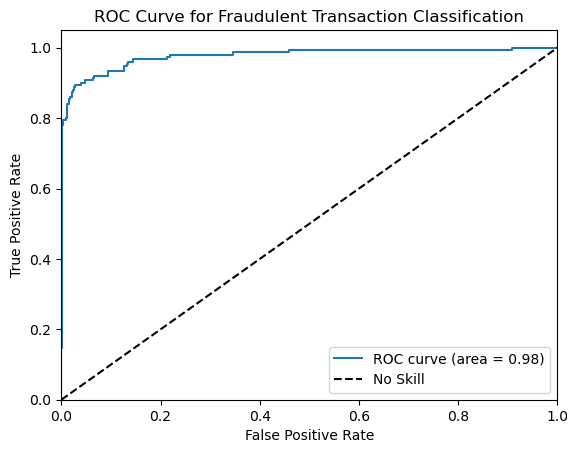

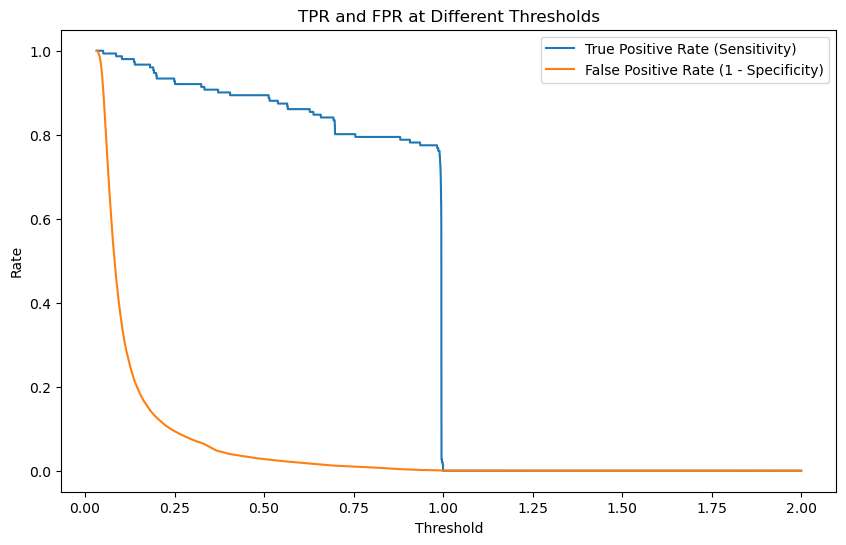

Optimal Threshold (Youden's J): 0.5129114672304702


In [64]:
# voting_model3
clf1 = DecisionTreeClassifier(criterion='gini', max_depth= 10, max_features= 'sqrt', max_leaf_nodes= 10, min_impurity_decrease= 0.01, min_samples_leaf= 1, min_samples_split= 2)
clf2 = LogisticRegression()
clf3 = LogisticRegression(penalty='elasticnet',solver='saga', l1_ratio=0.5)


voting_model3 = VotingClassifier(estimators=[('dt', clf1), ('LR', clf2), ('LR-E', clf3)], voting='soft')
result=model_result(train_X_scaled_under_sampled,test_X_scaled,train_y_under_sampled,test_y,voting_model3,"votingclassifier3(DT,LR,LR(elastic))","scaled balanced data")


train_X shape: (682, 30)
train_y shape: (682,)
test_X shape: (85443, 30)
test_y shape: (85443,)


C:\Users\Gayathri\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


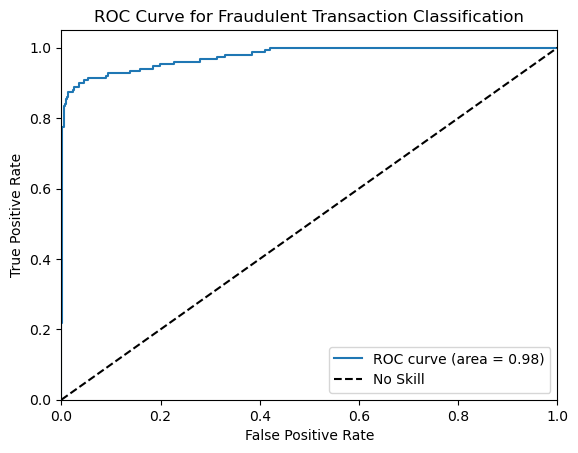

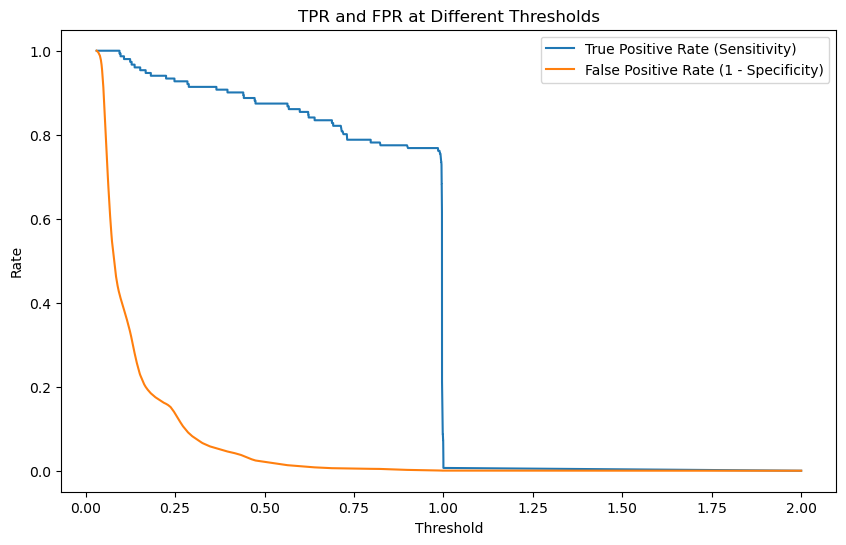

Optimal Threshold (Youden's J): 0.44056163443845503


In [65]:
# voting_model4
clf1 = LogisticRegression(penalty='elasticnet',solver='saga', l1_ratio=0.5)
clf2 = DecisionTreeClassifier(criterion='gini', max_depth= 10, max_features= 'sqrt', max_leaf_nodes= 10, min_impurity_decrease= 0.01, min_samples_leaf= 1, min_samples_split= 2)
clf3 = DecisionTreeClassifier(min_samples_split= 10, min_samples_leaf= 2, min_impurity_decrease=0.0, max_leaf_nodes= 10, max_features= 'sqrt', max_depth= 20, criterion= 'entropy')


voting_model4 = VotingClassifier(estimators=[('LR_E', clf1), ('DT1', clf2), ('DT2', clf3)], voting='soft')
result=model_result(train_X_scaled_under_sampled,test_X_scaled,train_y_under_sampled,test_y,voting_model4,"votingclassifier4(LR(elastic),DT1,DT2)","scaled balanced data")


train_X shape: (682, 30)
train_y shape: (682,)
test_X shape: (85443, 30)
test_y shape: (85443,)


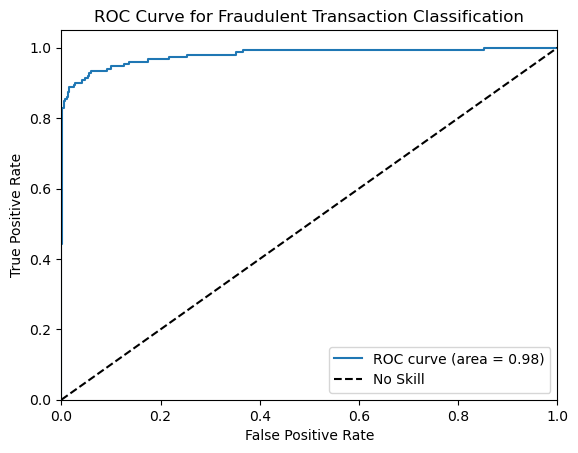

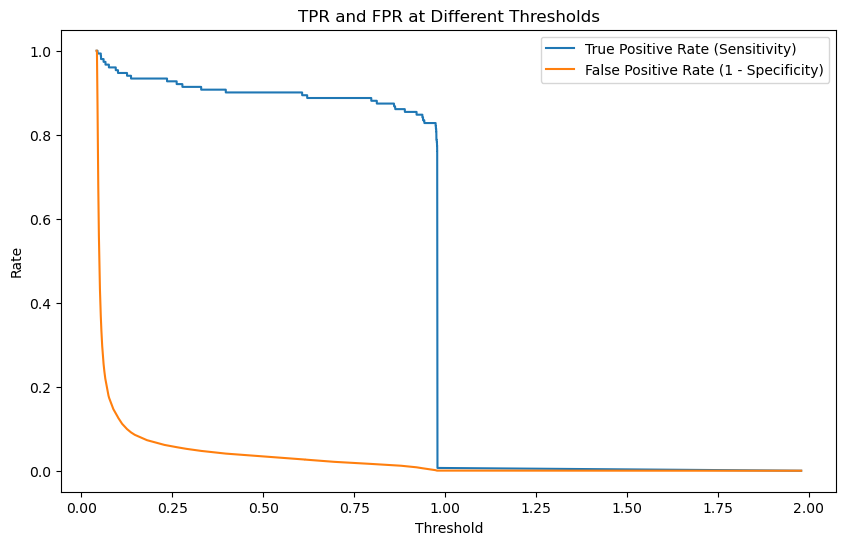

Optimal Threshold (Youden's J): 0.6066670643458704


In [66]:
#stacking3
estimators = [
    ('dt1', DecisionTreeClassifier(criterion='gini', max_depth= 10, max_features= 'sqrt', max_leaf_nodes= 10, min_impurity_decrease= 0.01, min_samples_leaf= 1, min_samples_split= 2)),
    ('rf2', LogisticRegression()),
    ('gbm', xgb.XGBClassifier(eval_metric='auc')),
    ('ada', AdaBoostClassifier(n_estimators=200))
    
]
stacking_model3 = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression(penalty='elasticnet',solver='saga', l1_ratio=0.5))
result=model_result(train_X_scaled_under_sampled,test_X_scaled,train_y_under_sampled,test_y,stacking_model3,"stacking-classifier3(DT,LG,XBG,ada---LR-E)","scaled balanced data")


train_X shape: (682, 30)
train_y shape: (682,)
test_X shape: (85443, 30)
test_y shape: (85443,)


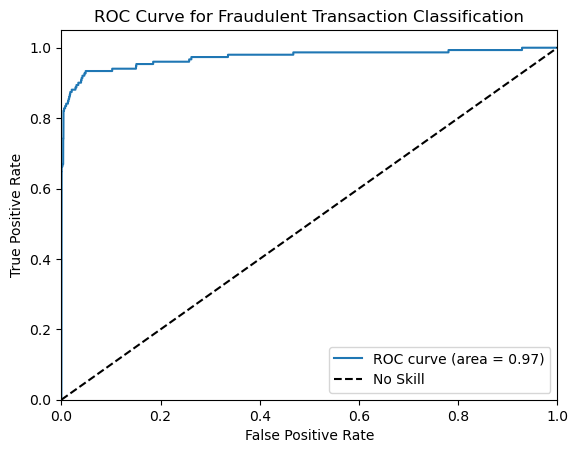

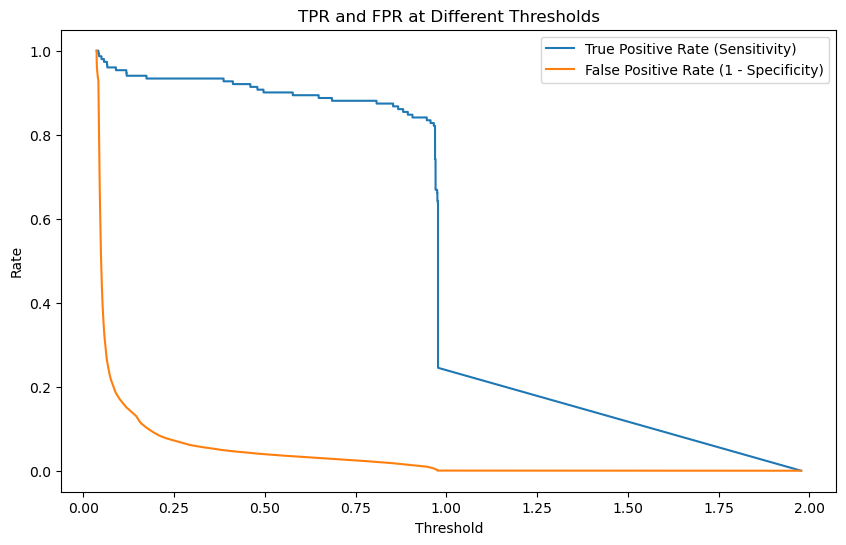

Optimal Threshold (Youden's J): 0.38665350347732735


In [67]:
#stacking2
estimators = [
    ('dt', DecisionTreeClassifier(criterion='gini', max_depth= 10, max_features= 'sqrt', max_leaf_nodes= 10, min_impurity_decrease= 0.01, min_samples_leaf= 1, min_samples_split= 2)),
    ('LR', LogisticRegression()),
]
stacking_model2 = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression(penalty='elasticnet',solver='saga', l1_ratio=0.5))
result=model_result(train_X_scaled_under_sampled,test_X_scaled,train_y_under_sampled,test_y,stacking_model2,"stacking-classifier2(DT,LR---LR-E)","scaled balanced data")


train_X shape: (682, 30)
train_y shape: (682,)
test_X shape: (85443, 30)
test_y shape: (85443,)


C:\Users\Gayathri\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\Gayathri\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\Gayathri\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\Gayathri\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\Gayathri\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\Gayathri\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarn

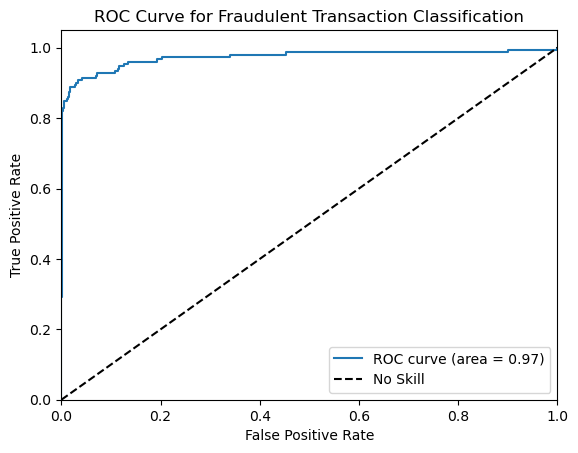

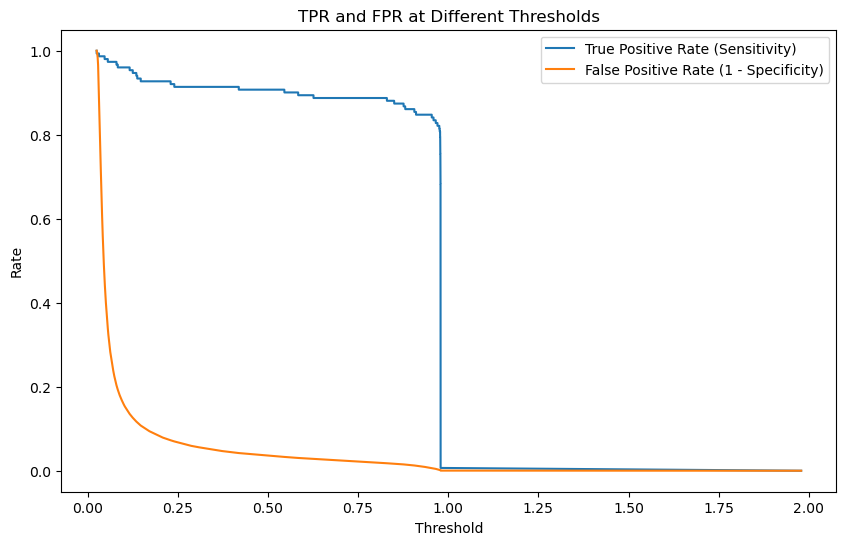

Optimal Threshold (Youden's J): 0.5453697890520742


In [68]:
#stacking1
estimators = [
    ('LR1', LogisticRegression(penalty='l1',solver='liblinear')),
    ('LR2', LogisticRegression()),
    ('LR3', LogisticRegression(penalty='elasticnet',solver='saga', l1_ratio=0.5))
]
stacking_model1 = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression(penalty='elasticnet',solver='saga', l1_ratio=0.5))
result=model_result(train_X_scaled_under_sampled,test_X_scaled,train_y_under_sampled,test_y,stacking_model1,"stacking-classifier1(LR(l1),LR,LR(EN)---LR(EN))","scaled balanced data")


train_X shape: (682, 30)
train_y shape: (682,)
test_X shape: (85443, 30)
test_y shape: (85443,)


C:\Users\Gayathri\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\Gayathri\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\Gayathri\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\Gayathri\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\Gayathri\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\Gayathri\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarn

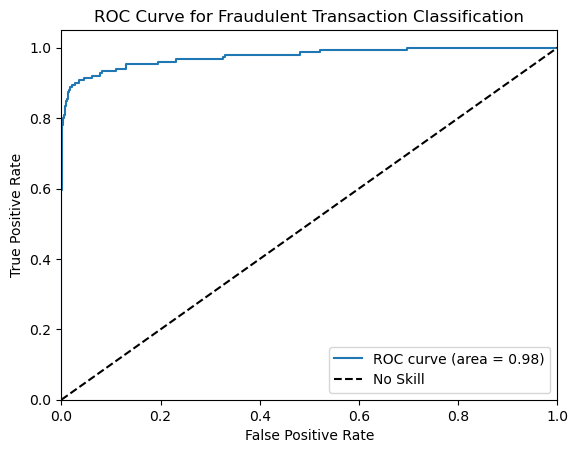

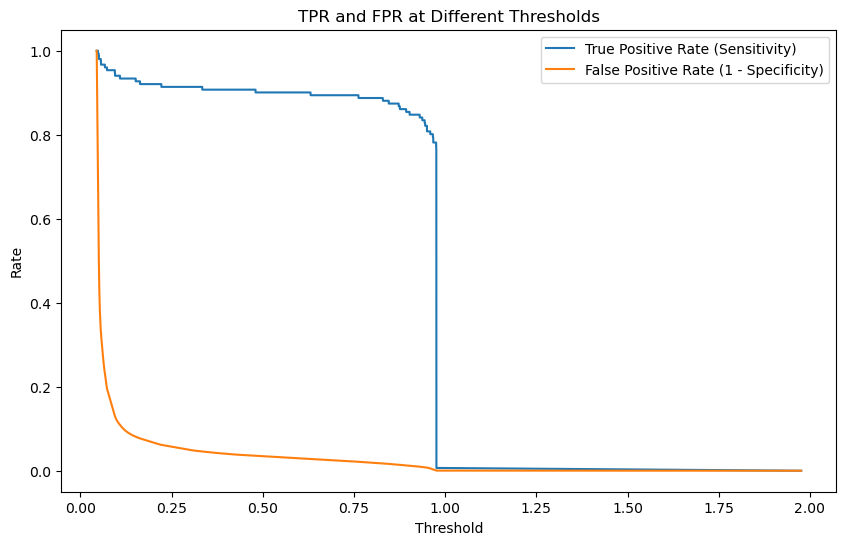

Optimal Threshold (Youden's J): 0.630542876284716


In [70]:
#stacking and voting
estimators = [
    ('SC1', stacking_model1),
    ('VC1', voting_model1),
]
stacking_model = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression(penalty='elasticnet',solver='saga', l1_ratio=0.5))
result=model_result(train_X_scaled_under_sampled,test_X_scaled,train_y_under_sampled,test_y,stacking_model,"stacking-classifier(best stacking and voting --- LR)","scaled balanced data")


In [73]:
results_df

,Model,Strategy,Recall of Fraud,F1 Score,ROC Score,Accuracy,test_confusion
0,logistic regression,notscaled unbalanced data,0.675497,0.653846,0.837402,0.998736,"[[85233, 59], [49, 102]]"
1,logistic regression,notscaled balanced data,0.894040,0.081081,0.929175,0.964187,"[[82248, 3044], [16, 135]]"
2,logistic regression,scaled unbalanced data,0.622517,0.717557,0.811159,0.999134,"[[85275, 17], [57, 94]]"
3,logistic regression,scaled balanced data,0.907285,0.077642,0.934643,0.961904,"[[82051, 3241], [14, 137]]"
4,Elastic,scaled balanced data,0.907285,0.089836,0.937451,0.967511,"[[82530, 2762], [14, 137]]"
5,Lasso,scaled balanced data,0.907285,0.080328,0.935335,0.963285,"[[82169, 3123], [14, 137]]"
6,KNN,scaled balanced data,0.867550,0.121409,0.922777,0.977810,"[[83416, 1876], [20, 131]]"
7,GaussionNB,scaled balanced data,0.854305,0.074459,0.908481,0.962466,"[[82107, 3185], [22, 129]]"
8,Decisiontree,scaled balanced data,0.874172,0.030010,0.887175,0.900132,"[[76778, 8514], [19, 132]]"
9,Randomforest classifier,scaled balanced data,0.900662,0.104898,0.936813,0.972836,"[[82986, 2306], [15, 136]]"


In [60]:
 results_df = results_df.iloc[:-7]

In [74]:
results_df.to_csv("model_result.csv", index=False)